In [13]:
import torch
import torchvision
from torchvision import transforms
from sklearn.cluster import KMeans

from torch.utils.data import Dataset



In [46]:
import natsort
from PIL import Image

In [50]:
class CustomDataSet(Dataset):
    def __init__(self, main_dir, transform):
        self.main_dir = main_dir
        self.transform = transform
        self.all_imgs = os.listdir(main_dir)
        self.total_imgs = natsort.natsorted(self.all_imgs)
        
        

    def __len__(self):
        return len(self.total_imgs)

    def __getitem__(self, idx):
        img_loc = os.path.join(self.main_dir, self.total_imgs[idx])
        image = Image.open(img_loc).convert("RGB")
        tensor_image = self.transform(image)
        return tensor_image

In [51]:
import os


transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor()])
my_dataset = CustomDataSet('/Users/tanishsurana/desktop/mlpcw7/images', transform=transform)
dataloader = torch.utils.data.DataLoader(my_dataset , batch_size=15, shuffle=False, 
                               num_workers=0, drop_last=True)





In [ ]:
import os


transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor()])
my_dataset = CustomDataSet('/Users/tanishsurana/desktop/mlpcw7/images', transform=transform)
dataloader = torch.utils.data.DataLoader(my_dataset , batch_size=15, shuffle=False, 
                               num_workers=0, drop_last=True)





In [56]:
# Extract features using a pre-trained CNN
model = torchvision.models.resnet18(pretrained=True)
model.eval()
features = []

print((dataloader))

with torch.no_grad():
    for _, images in enumerate(dataloader):
        outputs = model(images)
        features.append(outputs)
features = torch.cat(features, dim=0)



# Cluster the features using K-means
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
labels = kmeans.fit_predict(features.numpy())

# Visualize the clusters
for i in range(n_clusters):
    print(f'Cluster {i}: {sum(labels==i)} images')

Cluster 0: 1 images
Cluster 1: 6 images
Cluster 2: 6 images
Cluster 3: 10 images
Cluster 4: 7 images


/Users/tanishsurana/opt/anaconda3/envs/mlpcw7/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [62]:
import matplotlib.pyplot as plt 

In [69]:
print(enumerate(dataloader))

for i,j in enumerate(dataloader):
    print(i)

0
1


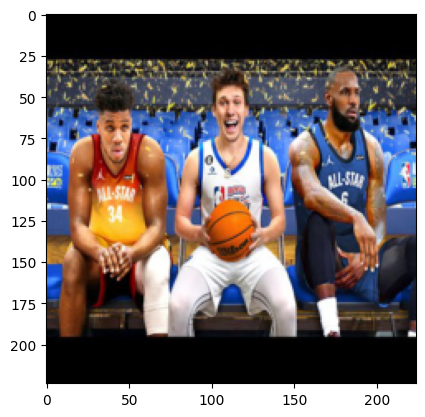

Label: 0


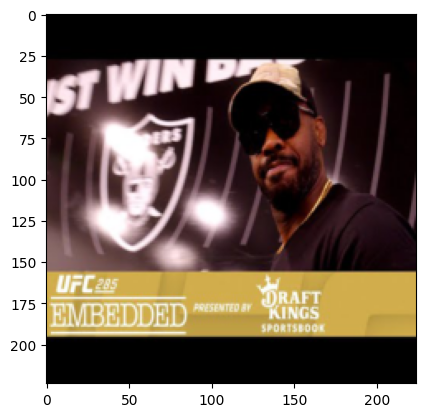

Label: 1


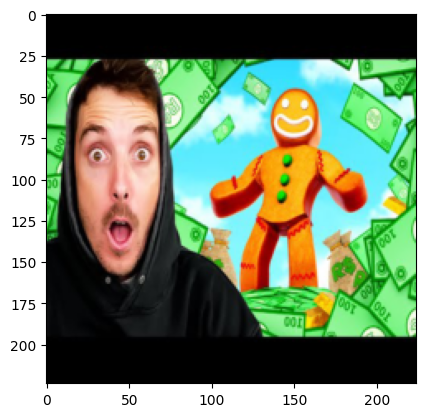

Label: 2


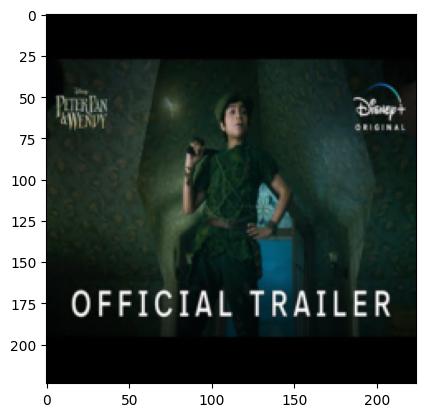

Label: 3


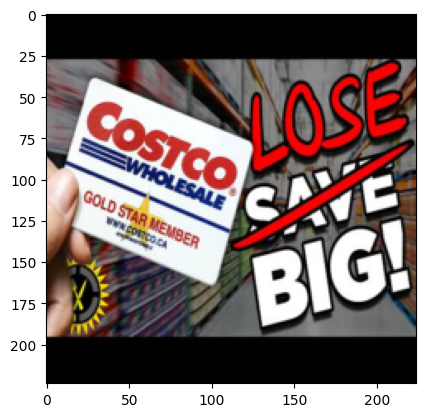

Label: 4


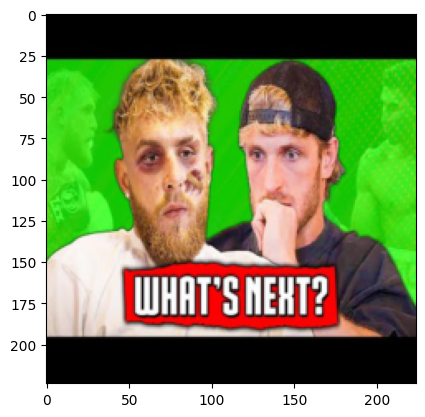

Label: 5


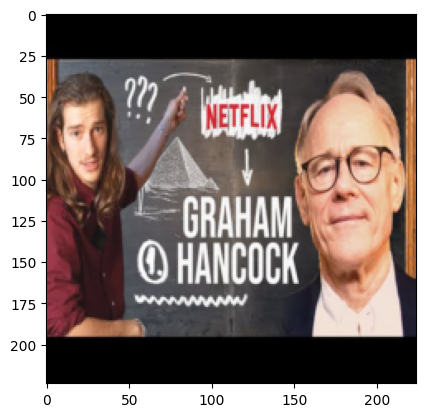

Label: 6


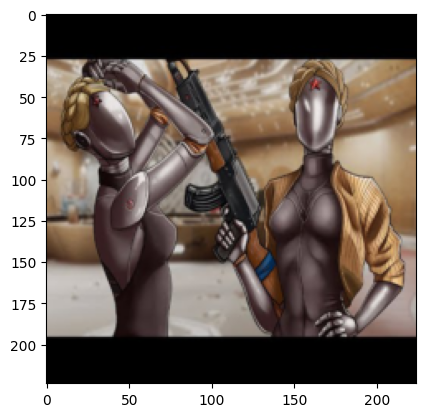

Label: 7


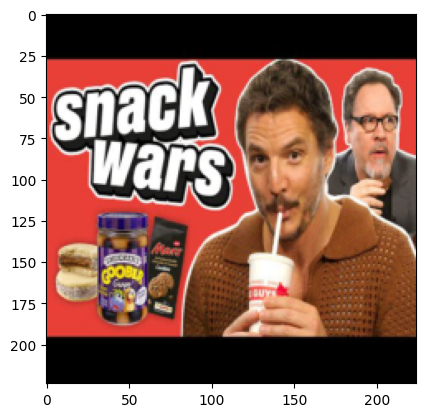

Label: 8


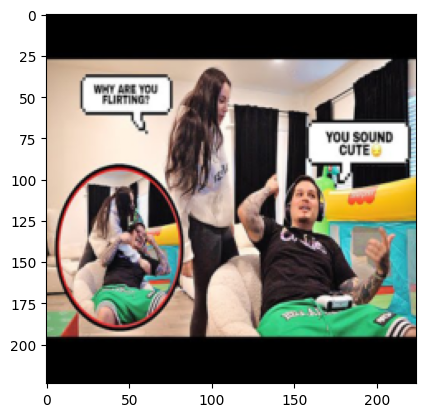

Label: 9


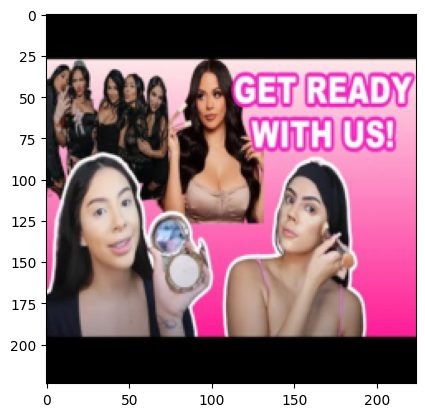

Label: 10


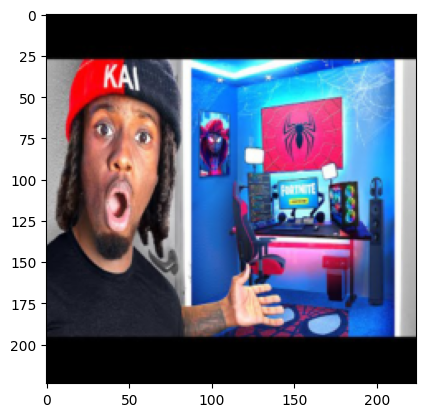

Label: 11


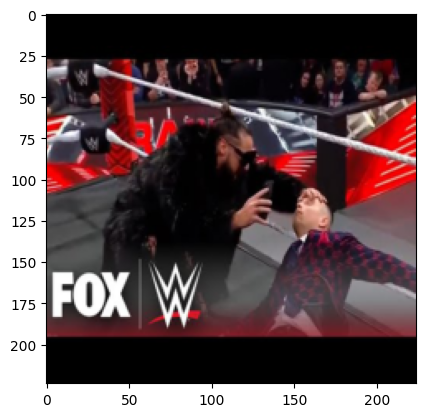

Label: 12


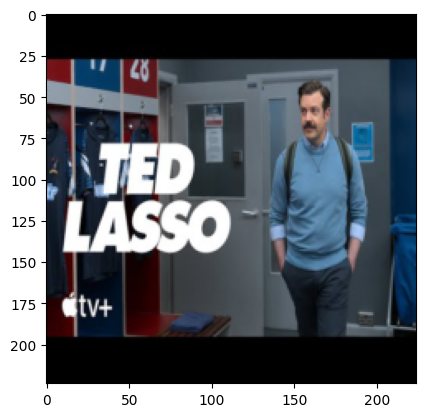

Label: 13


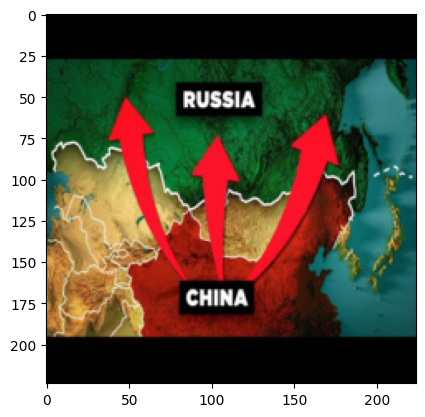

Label: 14


In [63]:
examples = next(iter(dataloader))

for label, img  in enumerate(examples):
   plt.imshow(img.permute(1,2,0))
   plt.show()
   print(f"Label: {label}")

In [71]:
print(len(labels))

30


In [75]:
for _, images in enumerate(dataloader):
    print(images[0].shape)


torch.Size([3, 224, 224])
torch.Size([3, 224, 224])


In [76]:
print(labels.shape)

(30,)


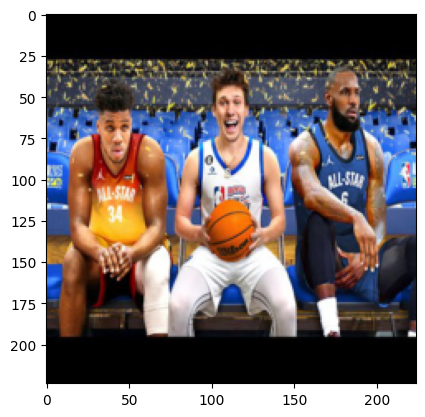

Label: 0


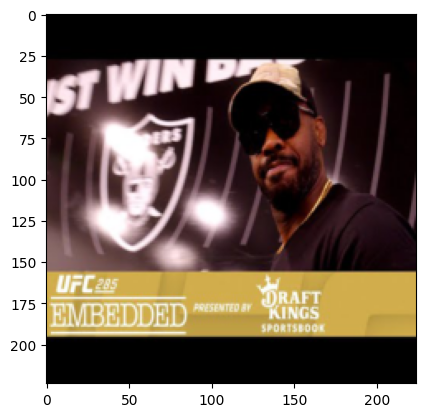

Label: 3


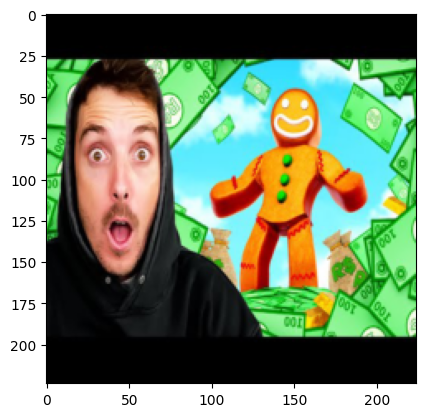

Label: 4


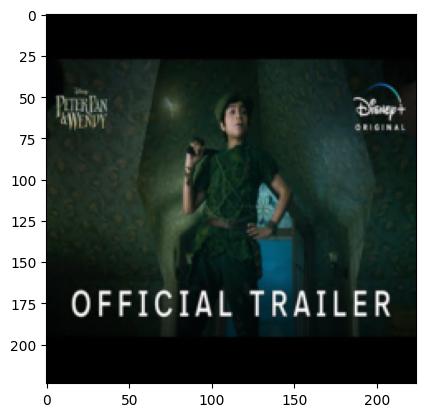

Label: 3


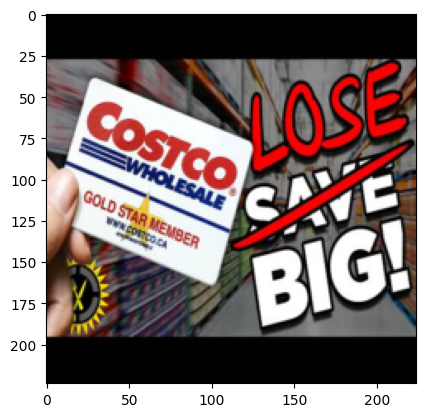

Label: 1


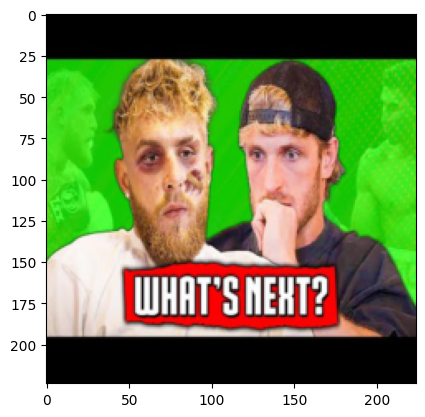

Label: 2


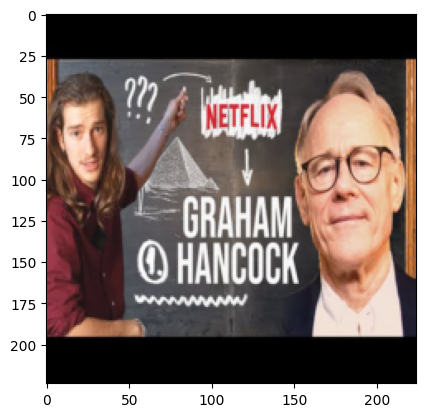

Label: 3


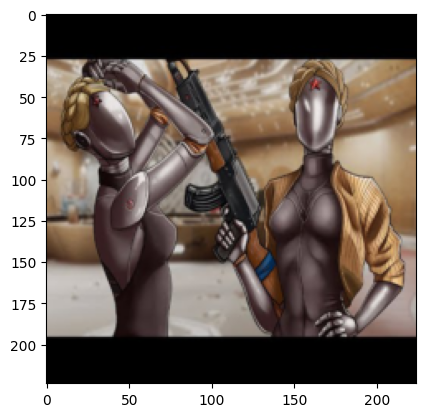

Label: 4


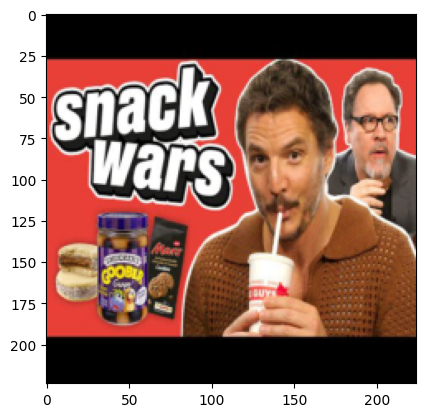

Label: 2


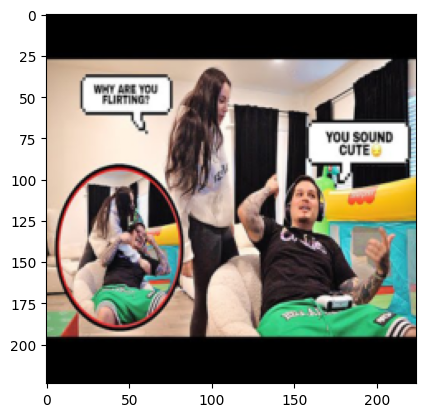

Label: 4


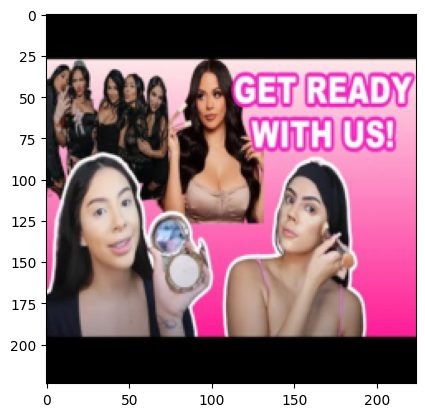

Label: 4


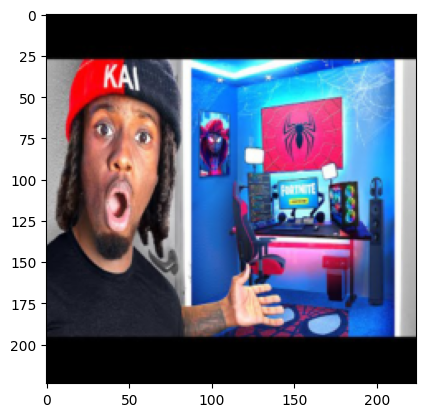

Label: 4


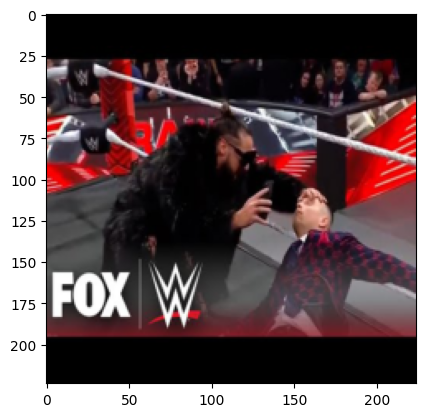

Label: 3


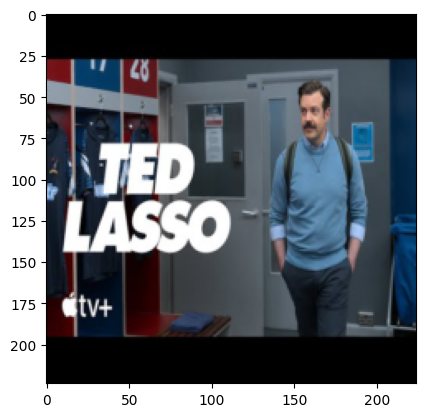

Label: 3


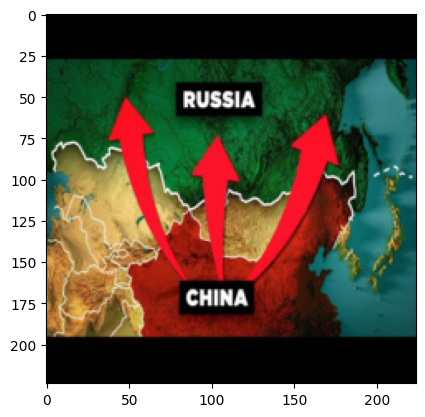

Label: 1


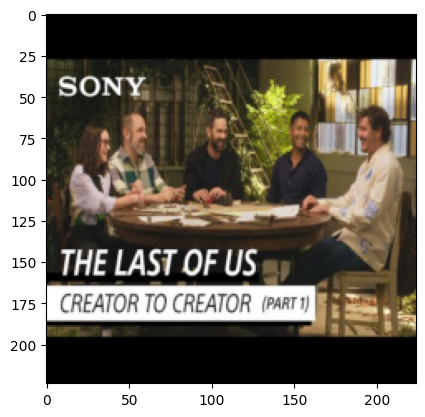

Label: 0


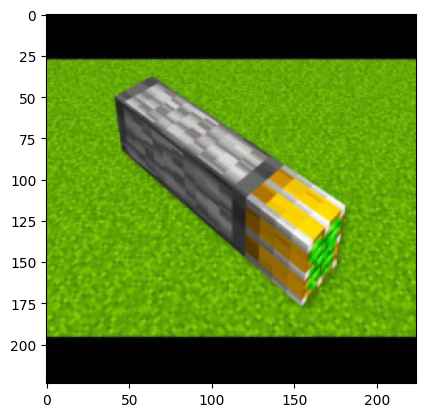

Label: 4


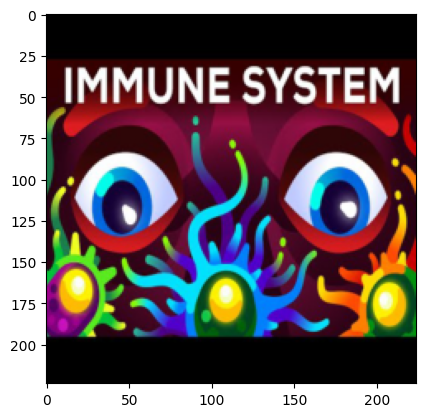

Label: 1


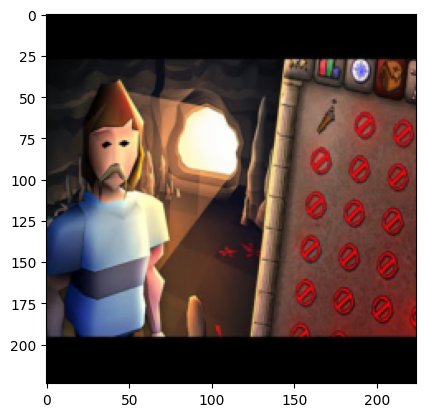

Label: 3


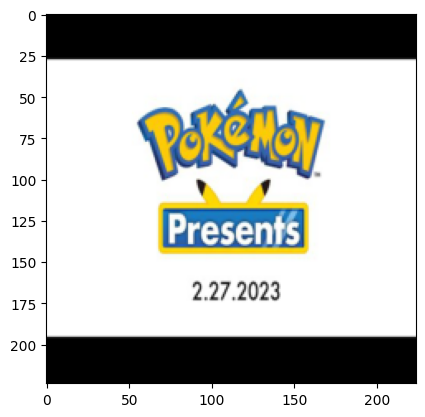

Label: 2


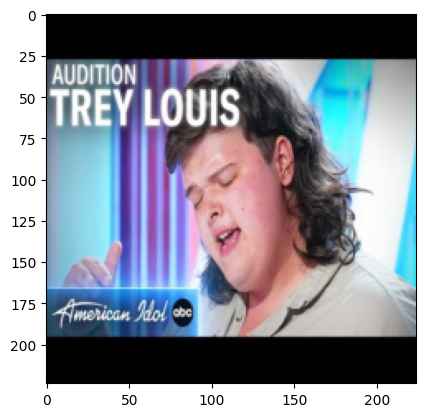

Label: 4


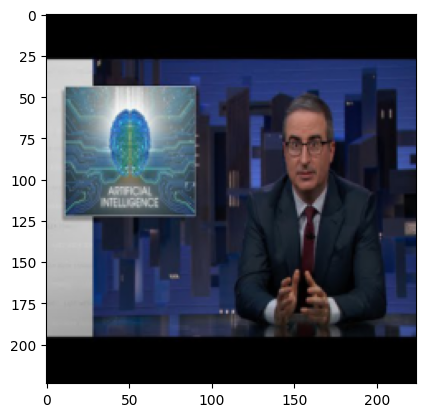

Label: 3


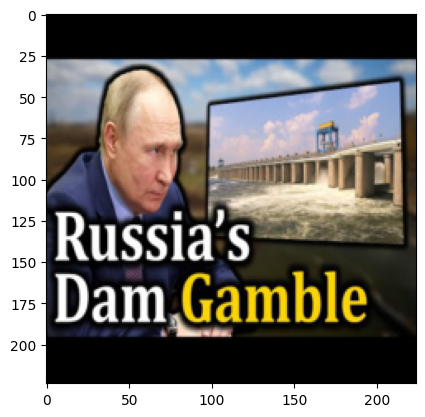

Label: 1


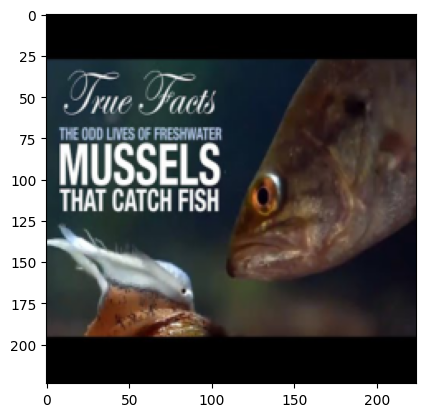

Label: 1


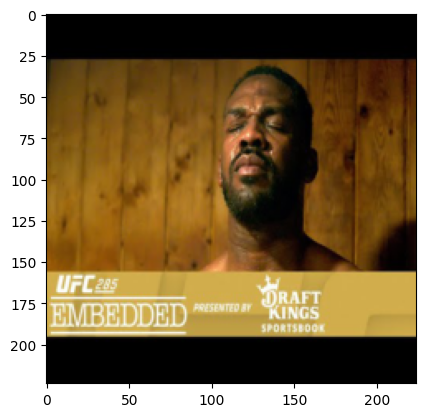

Label: 4


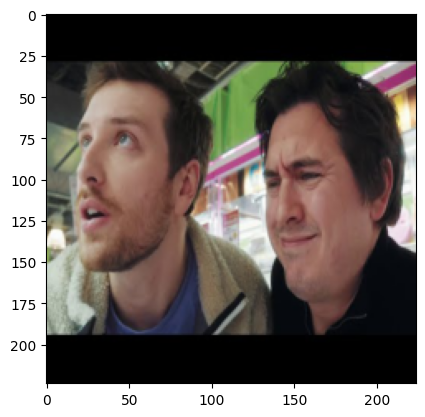

Label: 2


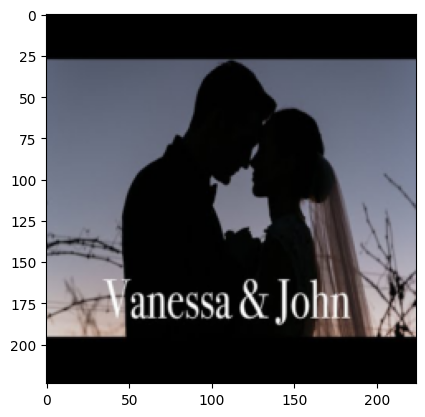

Label: 3


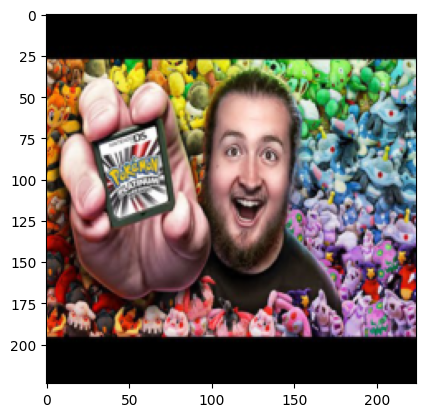

Label: 2


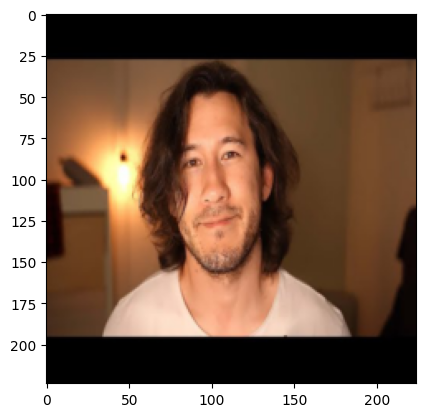

Label: 3


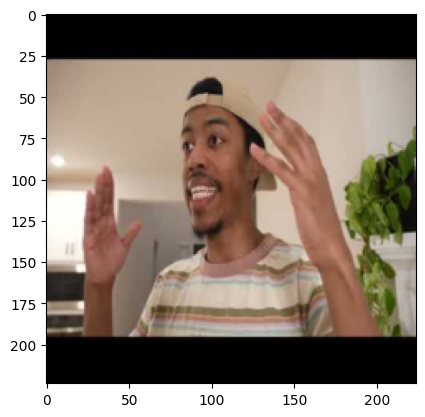

Label: 2


In [84]:
examples = next(iter(dataloader))
c = 1

dicc = dict()

for label, img  in enumerate(dataloader):
    bs = img.shape[0]

    for i in range(bs):
        
        dicc[im] = labels[i*c]
        
        im = img[i]
    
        plt.imshow(im.permute(1,2,0))
        plt.show()
        print(f"Label: {labels[i*c]}")
    
    c += 1
    

In [86]:
dicc2 = dict(sorted(dicc.items(), key=lambda item: item[1]))

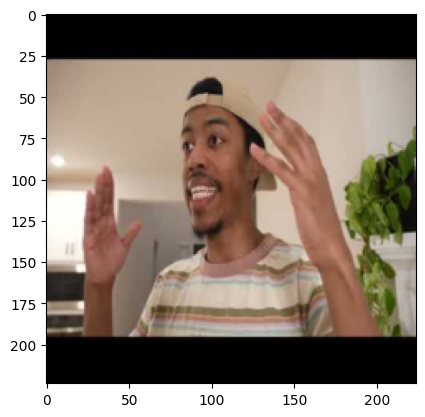

Label: 0


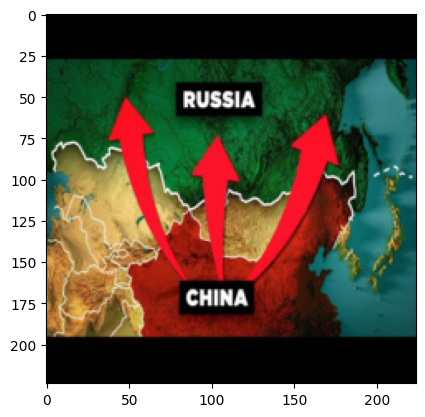

Label: 0


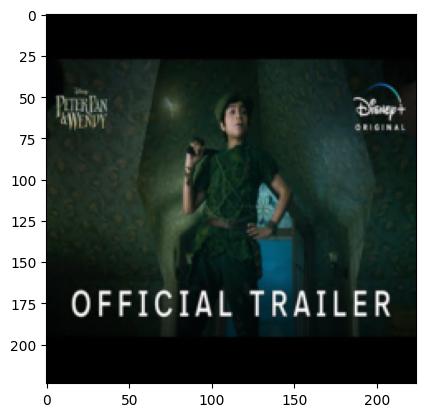

Label: 1


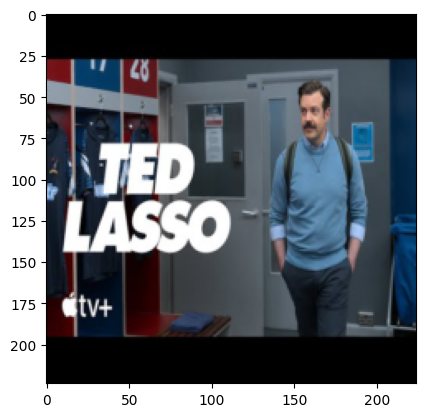

Label: 1


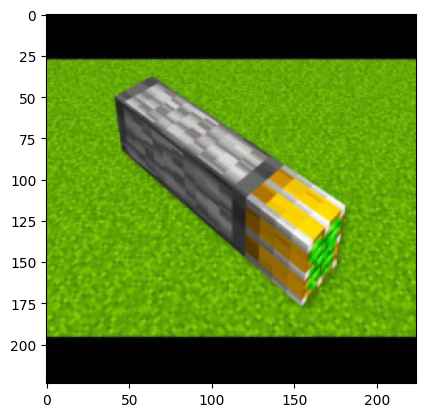

Label: 1


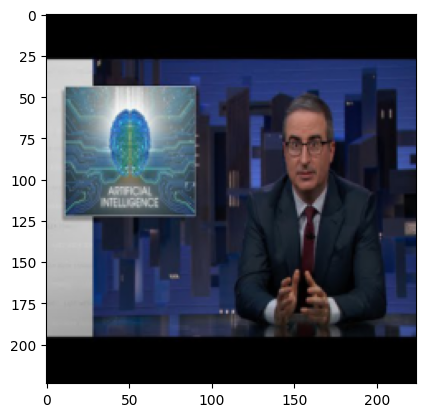

Label: 1


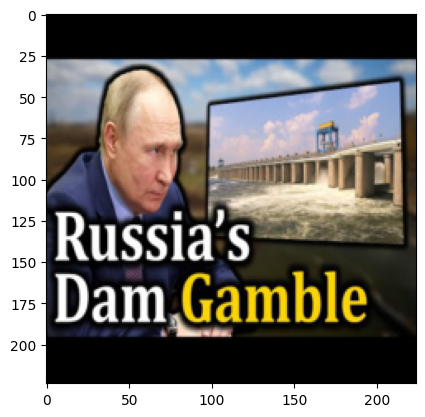

Label: 1


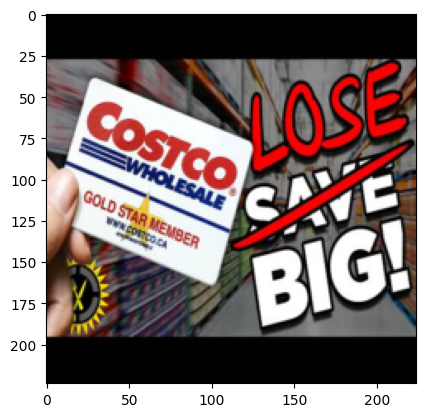

Label: 2


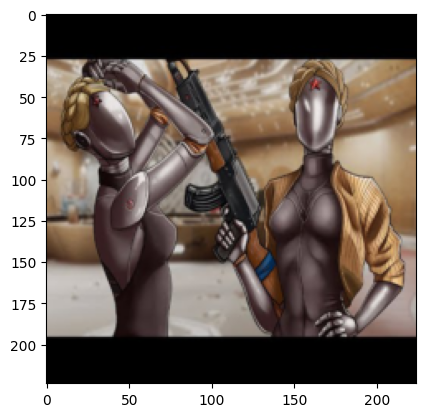

Label: 2


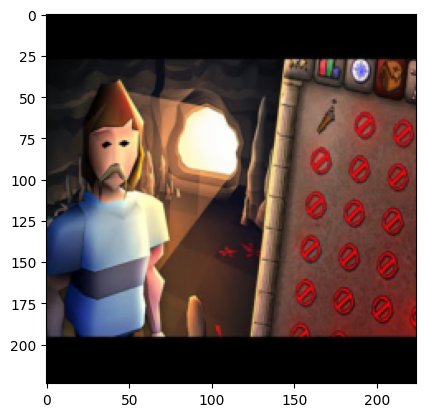

Label: 2


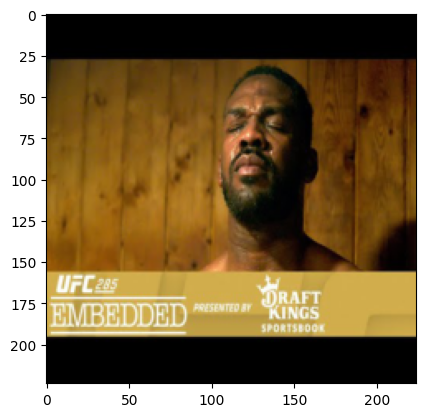

Label: 2


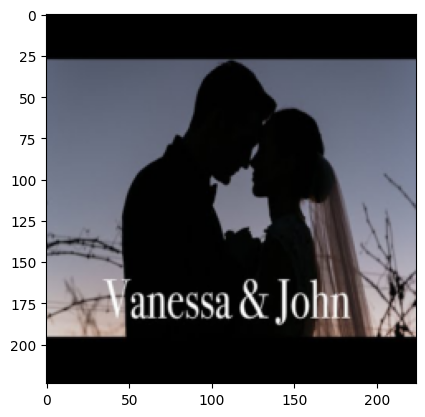

Label: 2


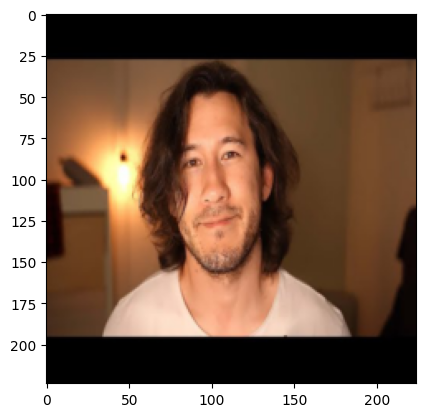

Label: 2


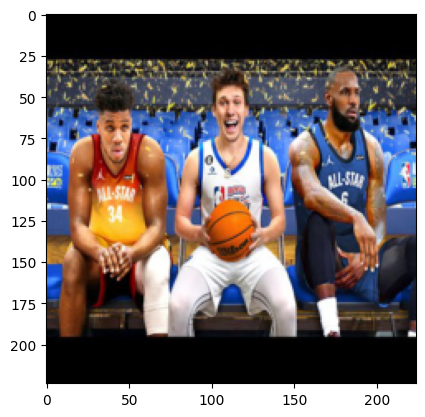

Label: 3


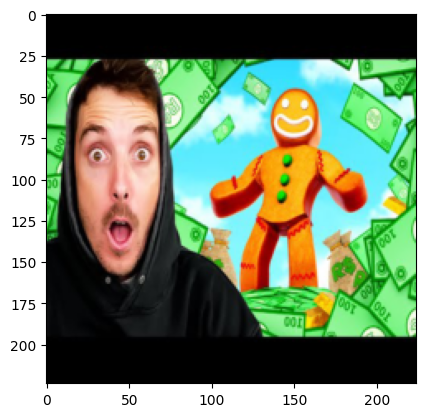

Label: 3


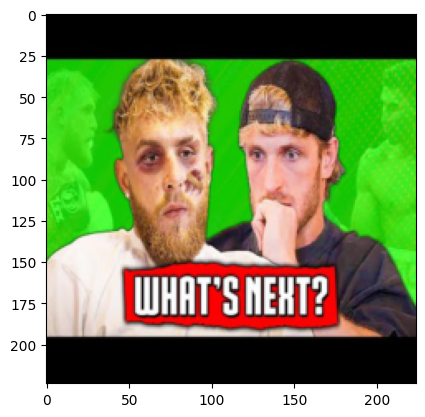

Label: 3


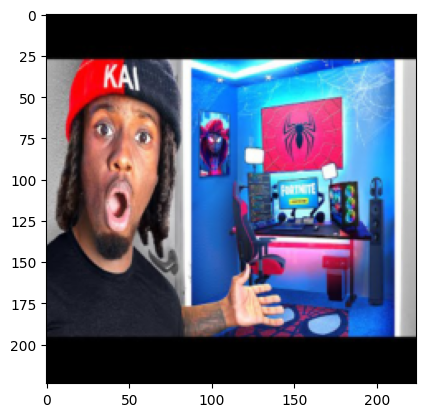

Label: 3


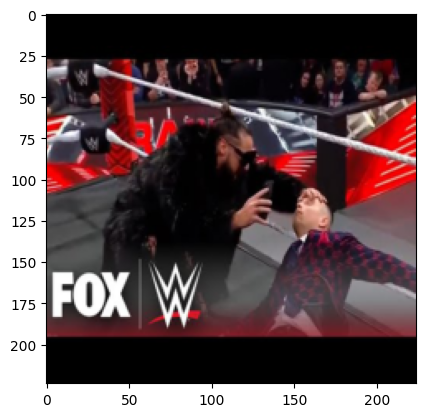

Label: 3


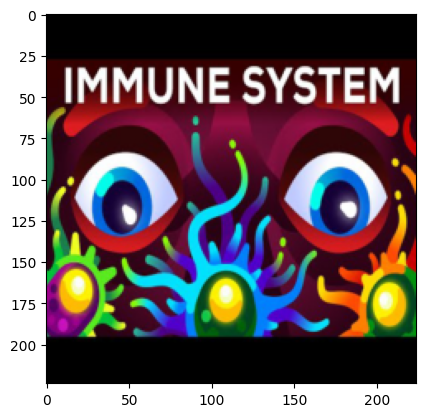

Label: 3


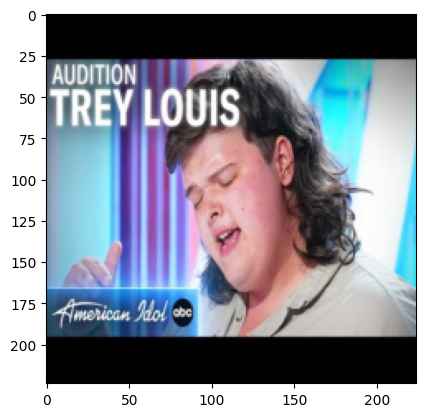

Label: 3


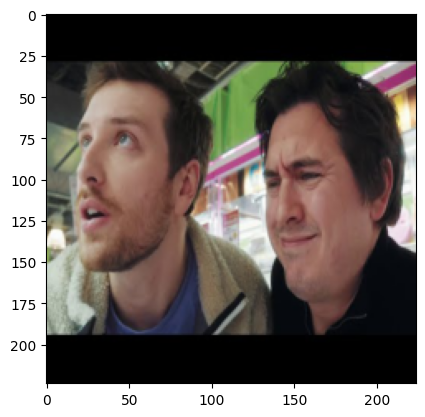

Label: 3


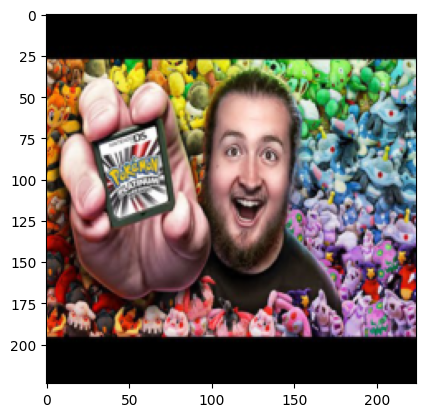

Label: 3


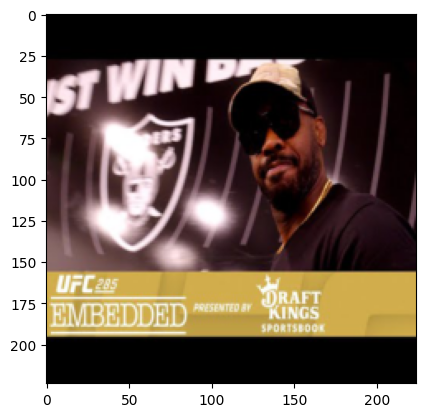

Label: 4


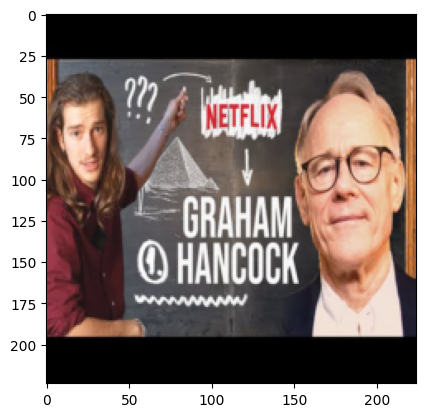

Label: 4


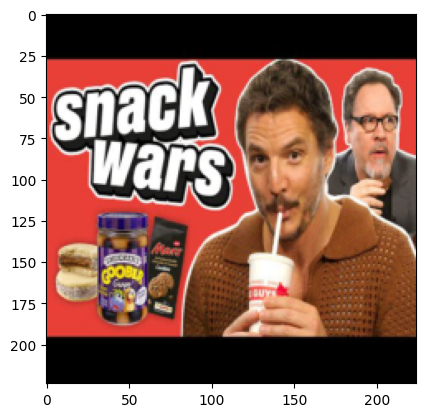

Label: 4


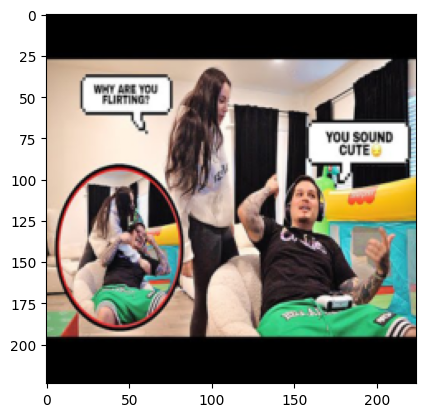

Label: 4


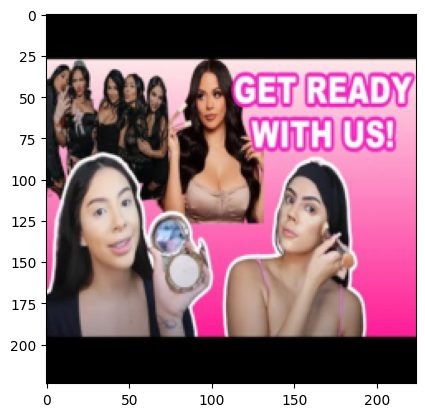

Label: 4


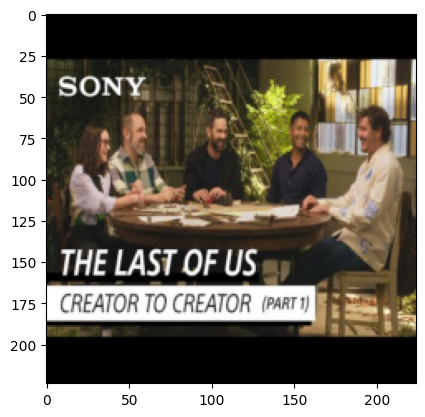

Label: 4


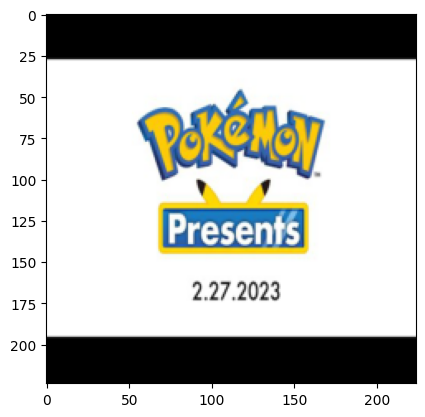

Label: 4


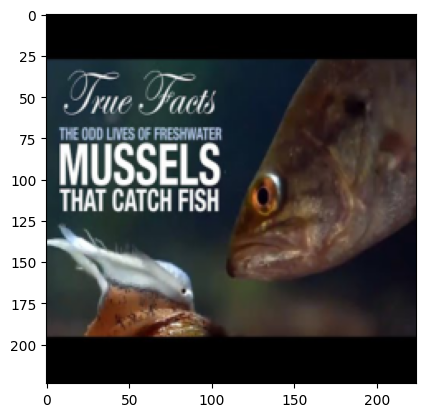

Label: 4


In [87]:
for k, v in dicc2.items():
    plt.imshow(k.permute(1,2,0))
    plt.show()
    print(f"Label: {v}")

In [137]:
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor()])
my_dataset = CustomDataSet('/Users/tanishsurana/Desktop/mlpcw7/mlp-project/dataset/', transform=transform)
dataloader = torch.utils.data.DataLoader(my_dataset , batch_size=15, shuffle=False, 
                               num_workers=0, drop_last=True)





/Users/tanishsurana/opt/anaconda3/envs/mlpcw7/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/tanishsurana/opt/anaconda3/envs/mlpcw7/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


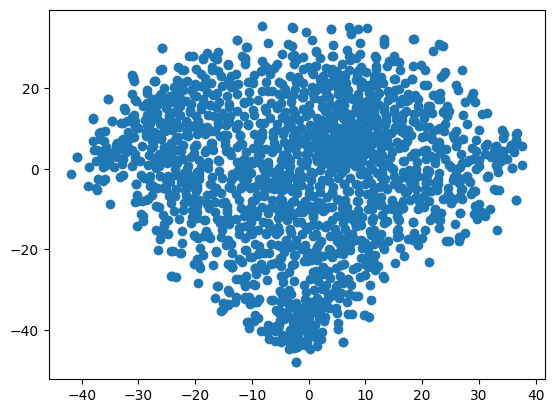

In [144]:
# Extract features using a pre-trained CNN
model = torchvision.models.resnet18(pretrained=True)
model.eval()
features = []



with torch.no_grad():
    for _, images in enumerate(dataloader):
        outputs = model(images)
        features.append(outputs)
features = torch.cat(features, dim=0)



from sklearn.manifold import TSNE
import matplotlib.pyplot as plt



tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=0).fit_transform(features)

plt.scatter(tsne[:, 0], tsne[:, 1])
plt.show()

In [147]:
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))



In [148]:
import torchvision.transforms as T
images = []
transform = T.ToPILImage()

for label, img in enumerate(dataloader):
    bs = img.shape[0]
    for i in range(bs):
        temp = transform(img[i])
        images.append(temp)


/var/folders/xv/987zgnq92fn66vf5qmyt1_s80000gn/T/ipykernel_33566/259306955.py:13: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)


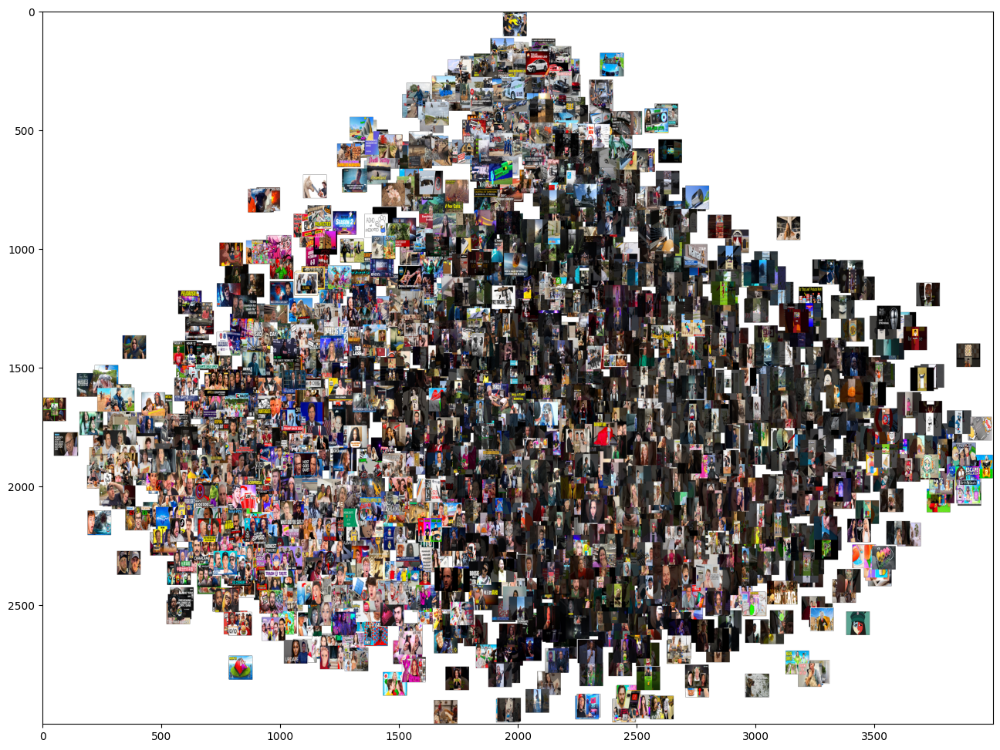

In [149]:
r = 1

width = int(4000*r)
height = int(3000*r)
max_dim = 100

full_image = Image.new('RGBA', (width, height))


for img, x, y in zip(images, tx, ty):
    tile = img
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

plt.figure(figsize = (16,12))
plt.imshow(full_image)

In [150]:
print(features.shape)

torch.Size([1725, 1000])


In [154]:
from torchvision import models
from torchsummary import summary

summary(model, (3, 224, 224))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [155]:
features[0]

tensor([ 9.5293e-02,  1.1453e+00,  1.3527e+00,  2.1334e+00,  1.2842e+00,
         2.5179e+00,  1.5827e+00, -1.5205e+00, -2.8638e+00, -3.8159e+00,
        -1.5837e+00, -3.9933e+00, -6.2651e-01, -1.7588e+00, -1.0623e+00,
        -2.7251e+00, -1.1626e+00, -2.3876e+00, -3.7205e+00, -2.1093e+00,
        -5.6119e+00, -5.8001e-01, -3.0426e+00,  4.7447e-01, -2.2874e+00,
        -3.8016e+00, -1.8377e+00, -1.7716e+00, -4.1925e+00, -8.2994e-02,
        -2.7908e+00, -4.5661e-01, -1.2468e+00, -2.4031e+00, -4.3597e+00,
        -2.0069e+00,  5.7265e-01, -2.1583e+00,  4.9184e-01, -1.8714e+00,
        -2.2004e+00, -1.9152e+00, -3.2522e+00, -5.2549e-01, -2.6644e+00,
        -6.3048e-01, -1.7827e+00,  1.3435e-01, -3.4662e+00, -2.9843e+00,
        -1.8351e+00,  1.3273e-01, -1.0057e+00, -3.0663e-01, -2.1311e+00,
        -2.6380e+00, -3.1335e+00, -3.3575e+00, -2.4243e+00, -1.4013e+00,
        -1.1888e+00, -1.8526e+00, -1.5790e+00,  4.8204e-02,  6.6611e-01,
        -2.1127e+00, -2.3081e-01, -1.0246e+00, -1.7